In [1]:
# -*- coding: utf-8 -*-
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import warnings 
warnings.filterwarnings("ignore")

import json
import cv2
from yolo.backend.utils.box import draw_scaled_boxes
import yolo

print("=========================")

Using TensorFlow backend.


In [2]:
from yolo.frontend import create_yolo
# from yolo.utils.box import visualize_boxes
# from yolo.config import ConfigParser

# 1. create yolo instance
yolo_detector = create_yolo("ResNet50", ["10", "1", "2", "3", "4", "5", "6", "7", "8", "9"], 416)
# yolo_detector = config_parser.create_model(skip_detect_layer=False)
# yolo_detector = config_parser.create_detector(model)








__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 416, 416, 3)  0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 208, 208, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 208, 208, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 208, 208, 64) 0           bn_conv1[0][0]                   
__________________________________________________________________________________________________
max

In [3]:
# 2. load pretrained weighted file
# Pretrained weight file is at https://drive.google.com/drive/folders/1Lg3eAPC39G9GwVTCH3XzF73Eok-N-dER

DEFAULT_WEIGHT_FILE = os.path.join(yolo.PROJECT_ROOT, "weight/weights.h5")
yolo_detector.load_weights(DEFAULT_WEIGHT_FILE)

Loading pre-trained weights in /home/dan/DLandCV/hw3/keras-yolo2/weight/weights.h5


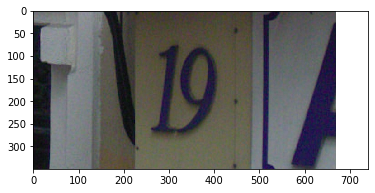

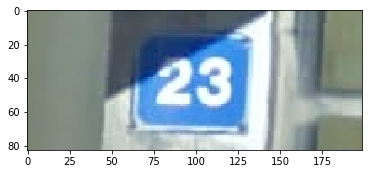

In [4]:
# 3. Load images

import os
import matplotlib.pyplot as plt
%matplotlib inline  
DEFAULT_IMAGE_FOLDER = os.path.join(yolo.PROJECT_ROOT, "tests", "dataset", "svhn", "imgs")

img_files = [os.path.join(DEFAULT_IMAGE_FOLDER, "1.png"), os.path.join(DEFAULT_IMAGE_FOLDER, "2.png")]
imgs = []
for fname in img_files:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imgs.append(img)
    plt.imshow(img)
    plt.show()

In [5]:
def sharpen_img(img):
    # Create kernel
#     kernel = np.array([[0, -1, 0], 
#                        [-1, 3,-1], 
#                        [0, -1, 0]])
    kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])

    # Sharpen image
    img_sharp = cv2.filter2D(img, -1, kernel)
    return img_sharp

1.png (47, 99, 3)


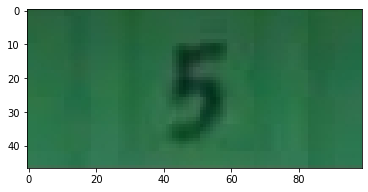

2.png (48, 182, 3)


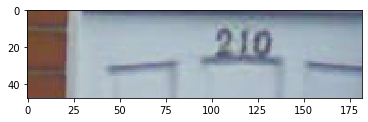

3.png (31, 101, 3)


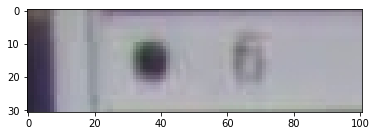

4.png (31, 75, 3)


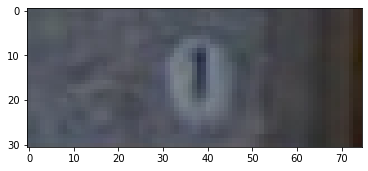

5.png (81, 215, 3)


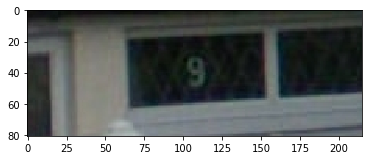

6.png (43, 94, 3)


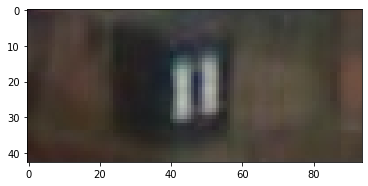

7.png (38, 99, 3)


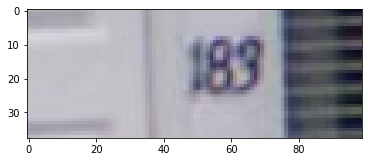

8.png (62, 133, 3)


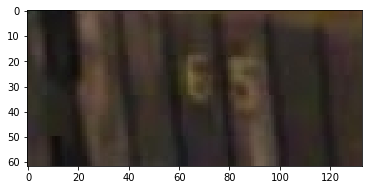

9.png (31, 94, 3)


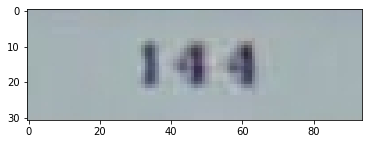

10.png (55, 87, 3)


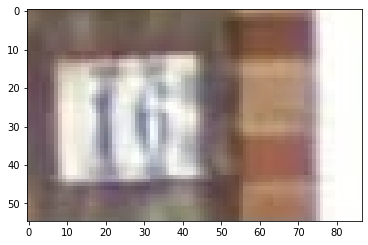

11.png (67, 153, 3)


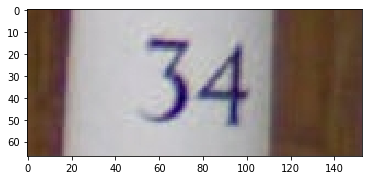

12.png (40, 82, 3)


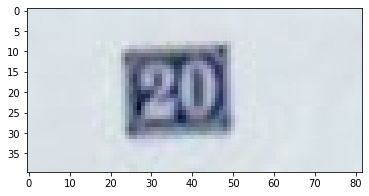

13.png (151, 288, 3)


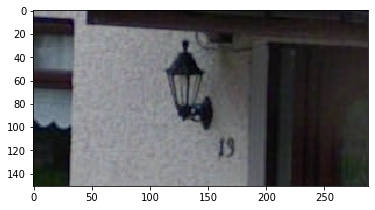

14.png (75, 155, 3)


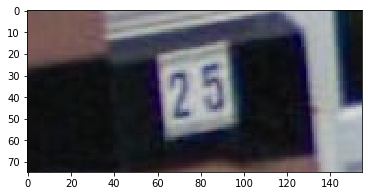

15.png (516, 833, 3)


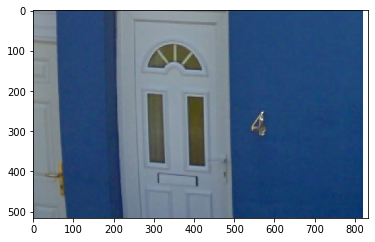

16.png (43, 95, 3)


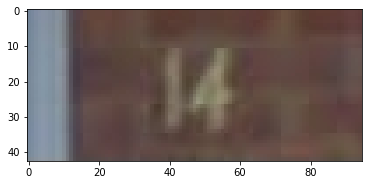

17.png (42, 105, 3)


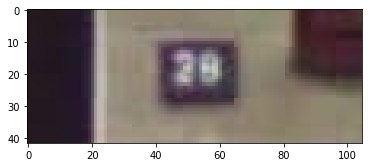

18.png (35, 94, 3)


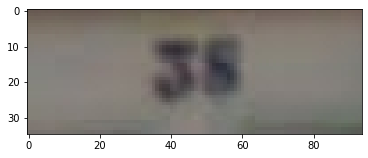

19.png (298, 600, 3)


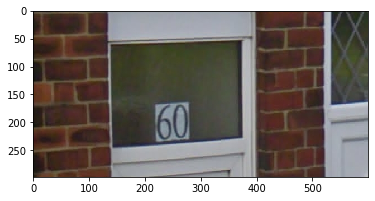

20.png (118, 269, 3)


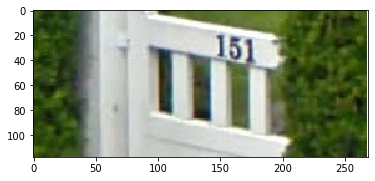

21.png (83, 139, 3)


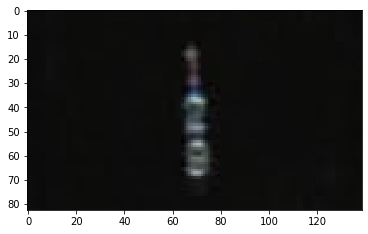

22.png (40, 104, 3)


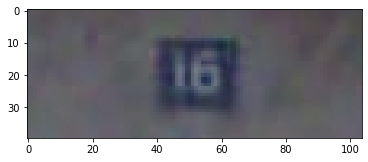

23.png (94, 196, 3)


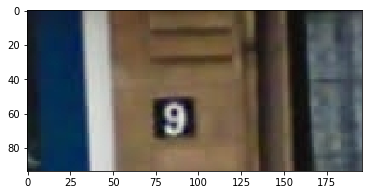

24.png (40, 113, 3)


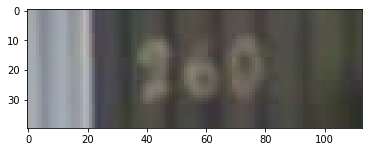

25.png (35, 73, 3)


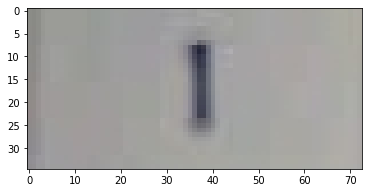

26.png (294, 764, 3)


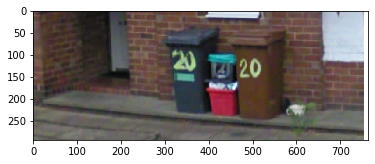

27.png (207, 404, 3)


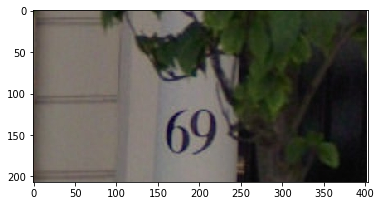

28.png (64, 155, 3)


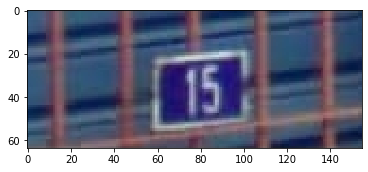

29.png (41, 119, 3)


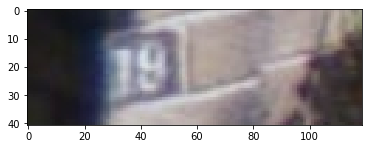

30.png (125, 281, 3)


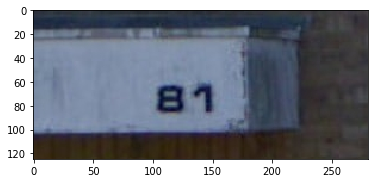

31.png (97, 148, 3)


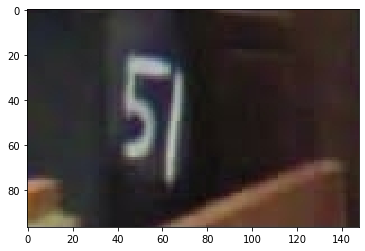

32.png (79, 173, 3)


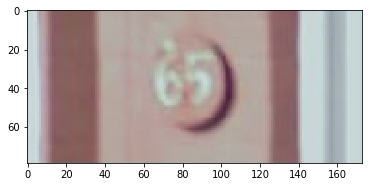

33.png (42, 146, 3)


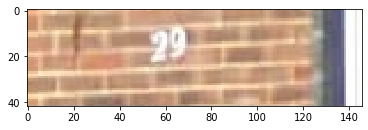

34.png (34, 78, 3)


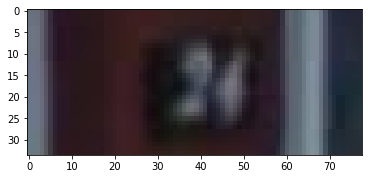

35.png (41, 143, 3)


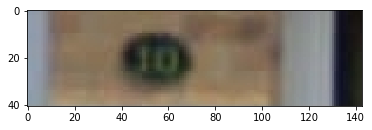

36.png (47, 222, 3)


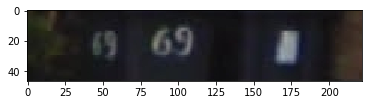

37.png (55, 262, 3)


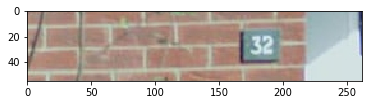

38.png (59, 130, 3)


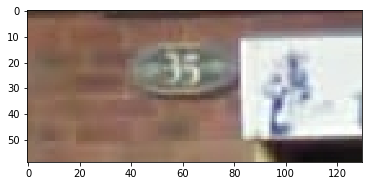

39.png (34, 60, 3)


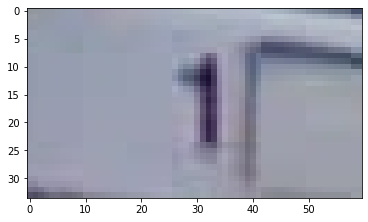

40.png (45, 110, 3)


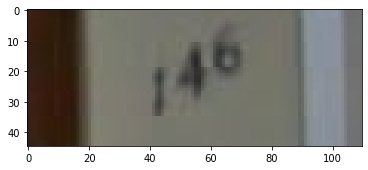

41.png (49, 116, 3)


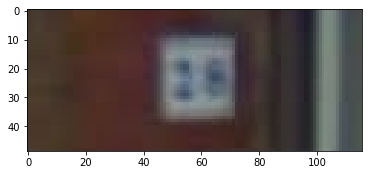

42.png (66, 140, 3)


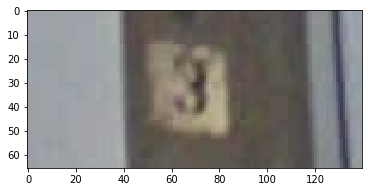

43.png (115, 347, 3)


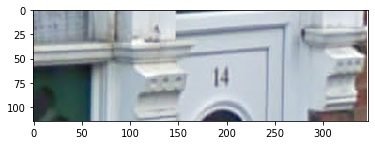

44.png (37, 95, 3)


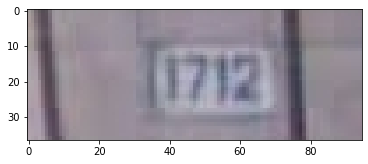

45.png (39, 92, 3)


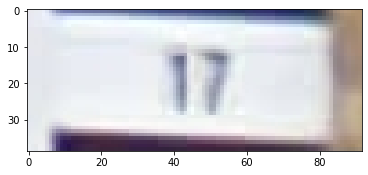

46.png (41, 87, 3)


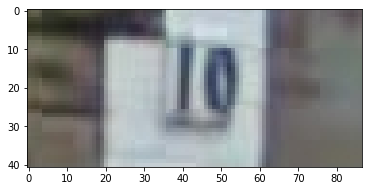

47.png (319, 621, 3)


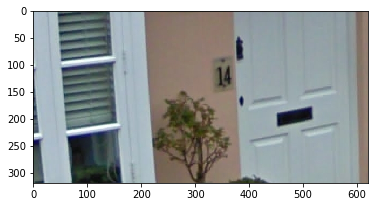

48.png (40, 126, 3)


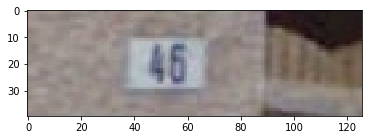

49.png (36, 83, 3)


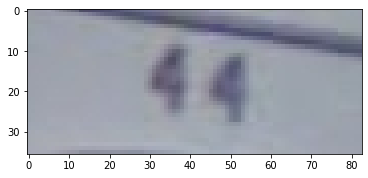

In [6]:
# 3. Load images

import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline  

DEFAULT_IMAGE_FOLDER = os.path.join(yolo.PROJECT_ROOT, "data_svhn", "test")

imgs = []
for i in range(1,50):
    img_file = os.path.join(DEFAULT_IMAGE_FOLDER, f"{i}.png")
    img = cv2.imread(img_file)
    print(f"{i}.png", img.shape)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imgs.append(img)
    plt.imshow(img)
    plt.show()

[[40 10 59 42]] [[0.         0.         0.         0.         0.         0.83385307
  0.         0.         0.         0.        ]]
1-boxes are detected.


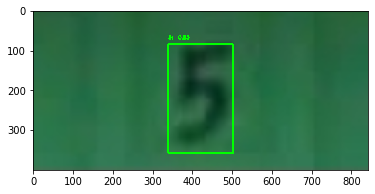

[[ 97   7 115  32]
 [120   8 137  32]] [[0.         0.         0.74744636 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.41242015 0.         0.         0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


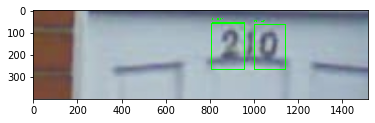

[[60  2 76 25]] [[0.         0.         0.         0.         0.         0.
  0.44323242 0.         0.         0.        ]]
1-boxes are detected.


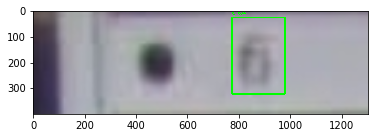

[] []
0-boxes are detected.


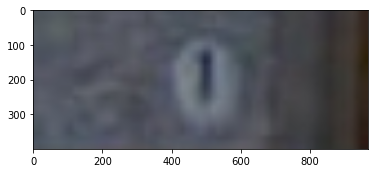

[] []
0-boxes are detected.


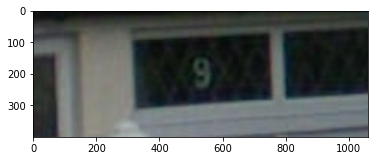

[[43 10 51 32]] [[0.        0.3308957 0.        0.        0.        0.        0.
  0.        0.        0.       ]]
1-boxes are detected.


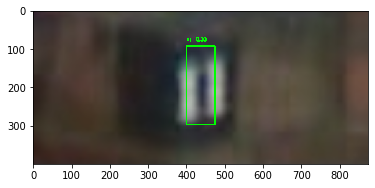

[[50  6 62 26]
 [61  6 71 25]] [[0.        0.        0.        0.        0.        0.        0.
  0.        0.8411261 0.       ]
 [0.        0.        0.        0.7411043 0.        0.        0.
  0.        0.        0.       ]]
2-boxes are detected.


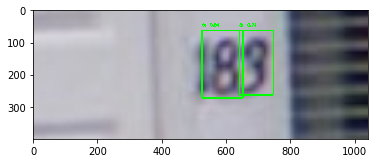

[[57  0 77 42]] [[0.        0.        0.        0.        0.        0.5242641 0.
  0.        0.        0.       ]]
1-boxes are detected.


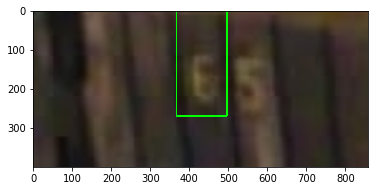

[[29  7 37 22]
 [34  7 43 22]
 [40  7 49 22]
 [48  7 58 21]] [[0.         0.69850796 0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.6655     0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.31067878 0.
  0.         0.         0.         0.        ]
 [0.         0.3532952  0.         0.         0.         0.
  0.         0.         0.         0.        ]]
4-boxes are detected.


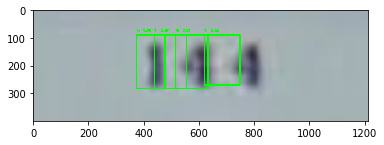

[] []
0-boxes are detected.


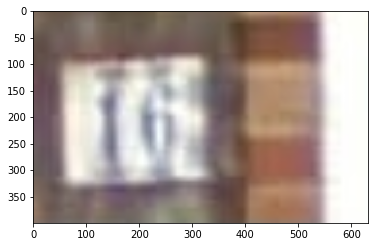

[[ 49   5  76  59]
 [ 75  10 103  55]] [[0.        0.        0.        0.9327655 0.        0.        0.
  0.        0.        0.       ]
 [0.        0.        0.        0.        0.9277736 0.        0.
  0.        0.        0.       ]]
2-boxes are detected.


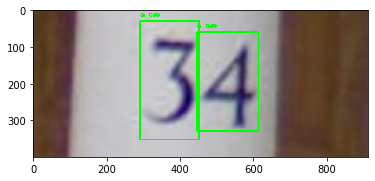

[[41  6 51 27]
 [24 11 36 29]] [[0.         0.34535453 0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.7428104  0.         0.         0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


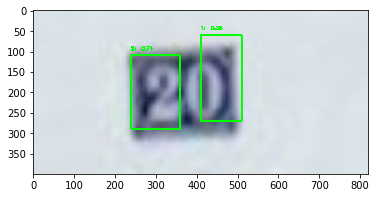

[] []
0-boxes are detected.


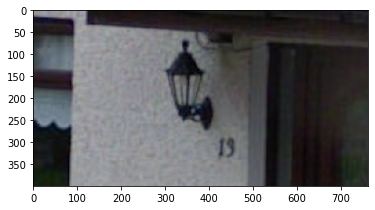

[[75 22 94 50]] [[0.       0.       0.       0.       0.       0.550657 0.       0.
  0.       0.      ]]
1-boxes are detected.


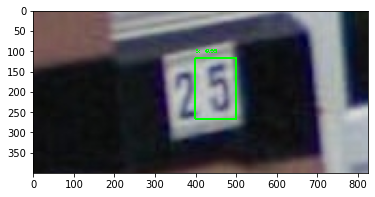

[] []
0-boxes are detected.


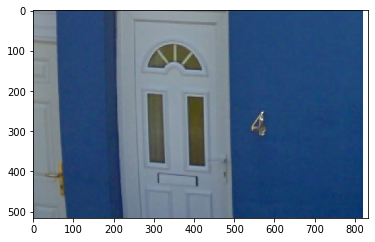

[[46  7 60 35]] [[0.        0.        0.        0.        0.8657586 0.        0.
  0.        0.        0.       ]]
1-boxes are detected.


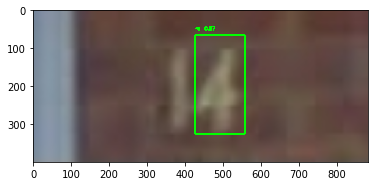

[[39  8 50 26]] [[0.         0.         0.         0.31855878 0.         0.
  0.         0.         0.         0.        ]]
1-boxes are detected.


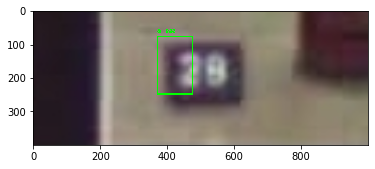

[[47  4 60 25]
 [34  5 47 28]] [[0.         0.         0.         0.         0.         0.
  0.         0.         0.82003915 0.        ]
 [0.         0.         0.         0.8021486  0.         0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


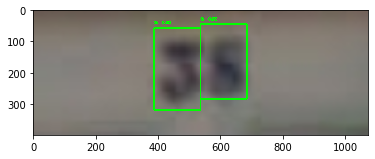

[] []
0-boxes are detected.


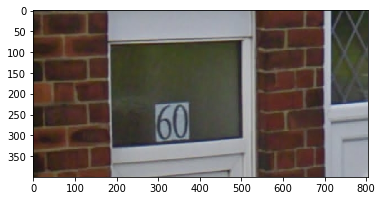

[[141  38 166  96]
 [160  35 190 101]] [[0.         0.5722677  0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.36471936 0.         0.         0.         0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


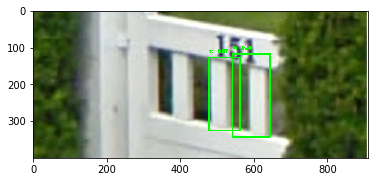

[] []
0-boxes are detected.


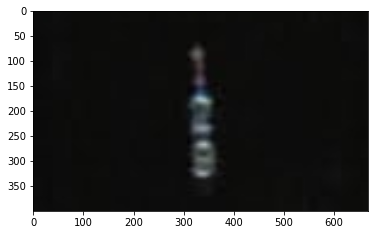

[[40  7 49 27]
 [54  6 66 28]] [[0.         0.40530995 0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.49904338 0.         0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


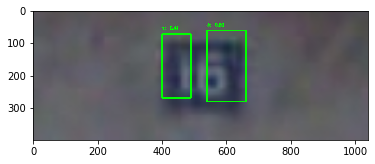

[] []
0-boxes are detected.


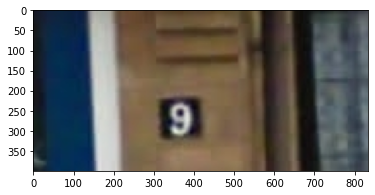

[] []
0-boxes are detected.


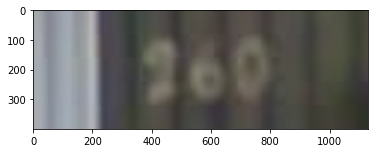

[[33  3 42 26]] [[0.         0.58798534 0.         0.         0.         0.
  0.         0.         0.         0.        ]]
1-boxes are detected.


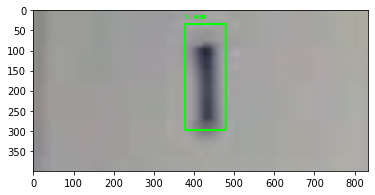

[] []
0-boxes are detected.


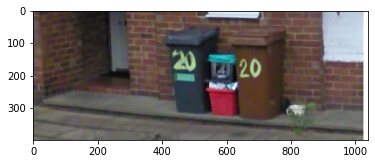

[[112   8 166 111]] [[0.       0.       0.       0.       0.       0.       0.       0.416038
  0.       0.      ]]
1-boxes are detected.


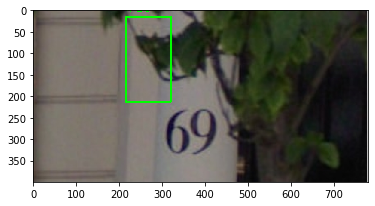

[[76 21 93 50]] [[0.        0.        0.        0.        0.        0.8468698 0.
  0.        0.        0.       ]]
1-boxes are detected.


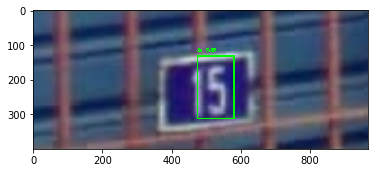

[[36  8 51 31]] [[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.56739086]]
1-boxes are detected.


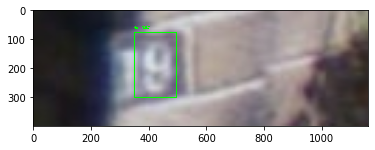

[] []
0-boxes are detected.


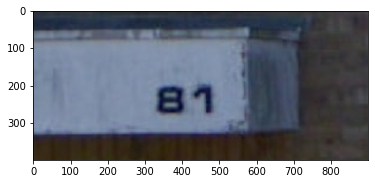

[[37 20 59 73]
 [56 23 74 76]] [[0.        0.        0.        0.        0.        0.6333021 0.
  0.        0.        0.       ]
 [0.        0.7295835 0.        0.        0.        0.        0.
  0.        0.        0.       ]]
2-boxes are detected.


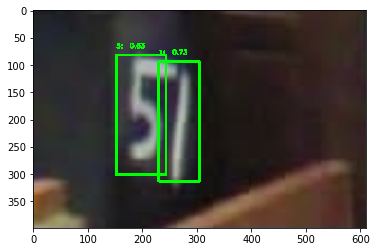

[[ 61   8  85  48]
 [ 63  12  84  51]
 [ 76  11 104  53]] [[0.         0.         0.         0.37336424 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.3418578  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.3475674  0.         0.         0.        ]]
3-boxes are detected.


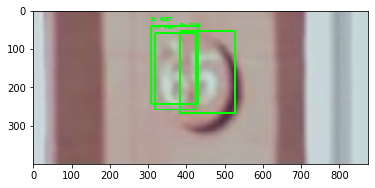

[] []
0-boxes are detected.


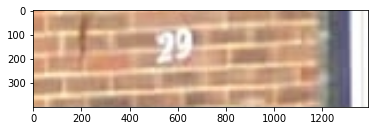

[[34  6 46 27]] [[0.        0.        0.5788471 0.        0.        0.        0.
  0.        0.        0.       ]]
1-boxes are detected.


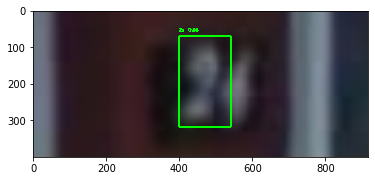

[] []
0-boxes are detected.


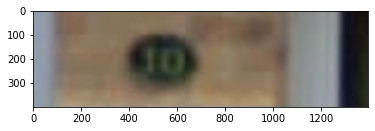

[[ 81   7 105  31]
 [159   7 188  38]] [[0.         0.         0.         0.         0.         0.
  0.63154817 0.         0.         0.        ]
 [0.         0.33113122 0.         0.         0.         0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


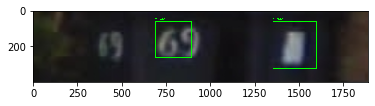

[] []
0-boxes are detected.


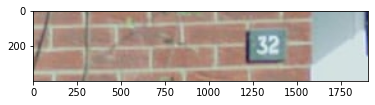

[[ 95  15 111  42]] [[0.         0.         0.         0.34281677 0.         0.
  0.         0.         0.         0.        ]]
1-boxes are detected.


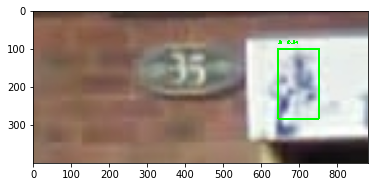

[[26  5 35 28]] [[0.         0.77723676 0.         0.         0.         0.
  0.         0.         0.         0.        ]]
1-boxes are detected.


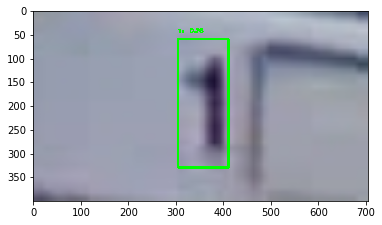

[[58  1 73 22]
 [47  7 59 29]] [[0.        0.        0.        0.        0.        0.        0.7382028
  0.        0.        0.       ]
 [0.        0.        0.        0.        0.8947368 0.        0.
  0.        0.        0.       ]]
2-boxes are detected.


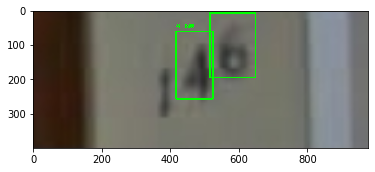

[[44 13 57 33]] [[0.        0.        0.        0.        0.        0.6234541 0.
  0.        0.        0.       ]]
1-boxes are detected.


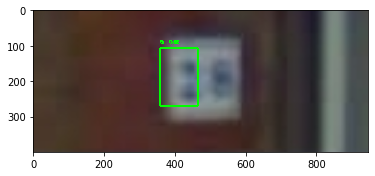

[[63 16 79 48]] [[0.         0.         0.         0.62108046 0.         0.
  0.         0.         0.         0.        ]]
1-boxes are detected.


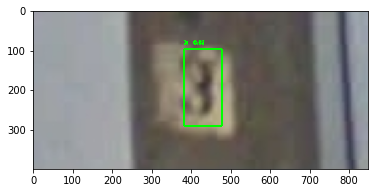

[] []
0-boxes are detected.


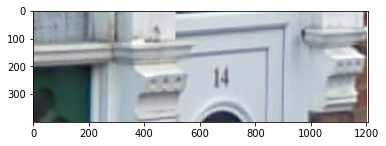

[[43  9 53 28]
 [56 10 69 28]] [[0.         0.         0.         0.         0.         0.
  0.         0.31435144 0.         0.        ]
 [0.         0.         0.6968729  0.         0.         0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


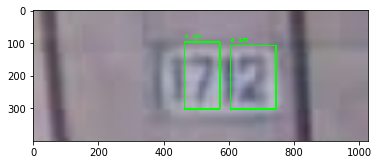

[[36  8 44 30]
 [44  9 58 30]] [[0.         0.42620945 0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.8338042  0.         0.        ]]
2-boxes are detected.


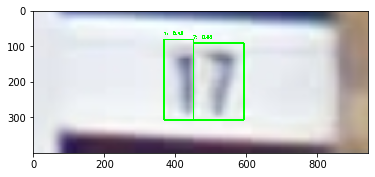

[[37  5 45 28]] [[0.        0.5915668 0.        0.        0.        0.        0.
  0.        0.        0.       ]]
1-boxes are detected.


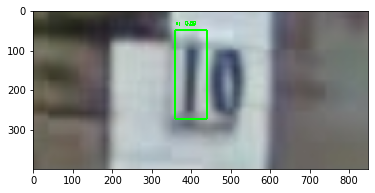

[] []
0-boxes are detected.


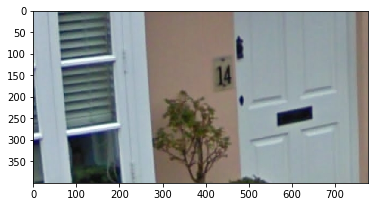

[[37 12 50 27]] [[0.         0.         0.         0.41755447 0.         0.
  0.         0.         0.         0.        ]]
1-boxes are detected.


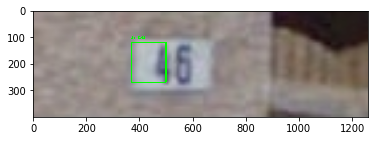

[[28  5 41 25]
 [42  8 53 27]] [[0.         0.         0.         0.         0.54884213 0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.3591127  0.
  0.         0.         0.         0.        ]]
2-boxes are detected.


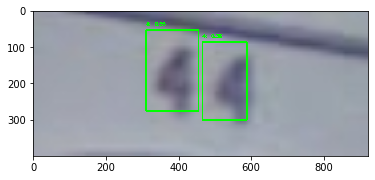

In [7]:
# 4. Predict digit region

THRESHOLD = 0.3
for img in imgs:
    boxes, probs = yolo_detector.predict(img, THRESHOLD)
    print(boxes, probs) #np.argmax(probs)

    # 4. save detection result
    image = draw_scaled_boxes(img,
                              boxes,
                              probs,
                              ["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"])

    print("{}-boxes are detected.".format(len(boxes)))
    plt.imshow(image)
    plt.show()


1.png (92, 176, 3)
1-boxes are detected.


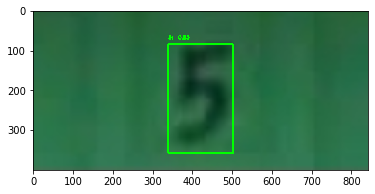

{'bbox': [[10, 40, 42, 59]], 'label': [5], 'score': [0.8338530659675598]} 

2.png (47, 99, 3)
2-boxes are detected.


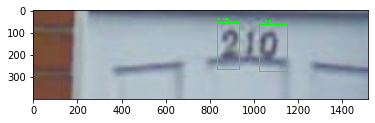

{'bbox': [[7, 100, 32, 112], [8, 123, 33, 138]], 'label': [2, 2], 'score': [0.8243128657341003, 0.5780048370361328]} 

3.png (48, 182, 3)
1-boxes are detected.


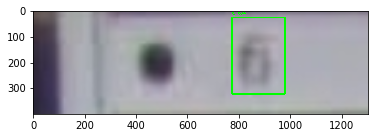

{'bbox': [[2, 60, 25, 76]], 'label': [6], 'score': [0.4432324171066284]} 

4.png (31, 101, 3)
0-boxes are detected.


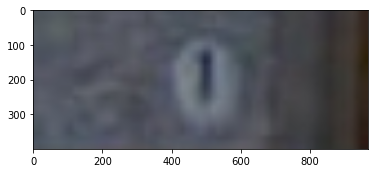

{'bbox': [], 'label': [], 'score': []} 

5.png (31, 75, 3)
1-boxes are detected.


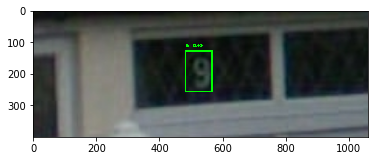

{'bbox': [[26, 98, 52, 115]], 'label': [9], 'score': [0.4267653226852417]} 

6.png (81, 215, 3)
2-boxes are detected.


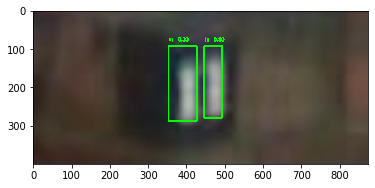

{'bbox': [[10, 38, 31, 46], [10, 48, 30, 53]], 'label': [1, 1], 'score': [0.3302329480648041, 0.4953385889530182]} 

7.png (43, 94, 3)
2-boxes are detected.


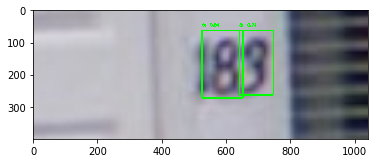

{'bbox': [[6, 50, 26, 62], [6, 61, 25, 71]], 'label': [8, 3], 'score': [0.8411260843276978, 0.7411043047904968]} 

8.png (38, 99, 3)
1-boxes are detected.


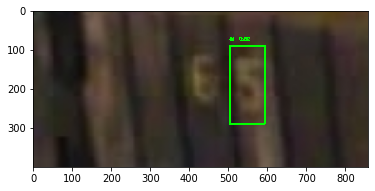

{'bbox': [[14, 78, 45, 92]], 'label': [5], 'score': [0.515820324420929]} 

9.png (62, 133, 3)
3-boxes are detected.


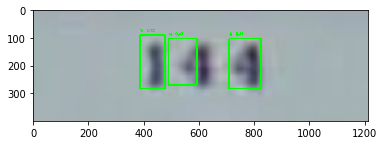

{'bbox': [[7, 30, 22, 37], [8, 38, 21, 46], [8, 55, 22, 64]], 'label': [1, 4, 4], 'score': [0.720125138759613, 0.4689819812774658, 0.4063689112663269]} 

10.png (31, 94, 3)
1-boxes are detected.


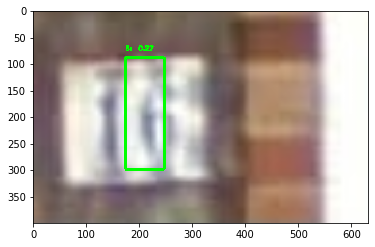

{'bbox': [[12, 24, 41, 34]], 'label': [6], 'score': [0.2681143879890442]} 

11.png (55, 87, 3)
2-boxes are detected.


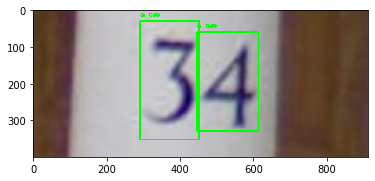

{'bbox': [[5, 49, 59, 76], [10, 75, 55, 103]], 'label': [3, 4], 'score': [0.9327654838562012, 0.9277735948562622]} 

12.png (67, 153, 3)
1-boxes are detected.


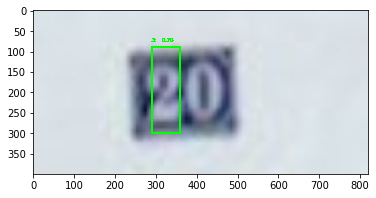

{'bbox': [[9, 29, 30, 36]], 'label': [3], 'score': [0.6997523307800293]} 

13.png (40, 82, 3)
3-boxes are detected.


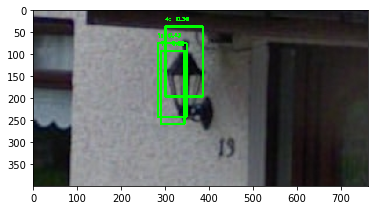

{'bbox': [[14, 114, 74, 146], [28, 107, 92, 132], [35, 110, 98, 130]], 'label': [4, 1, 7], 'score': [0.35536059737205505, 0.4312748312950134, 0.253147155046463]} 

14.png (151, 288, 3)
2-boxes are detected.


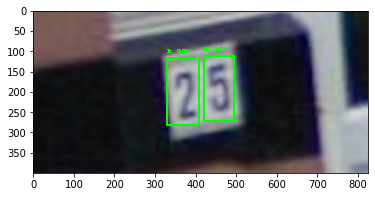

{'bbox': [[22, 62, 53, 77], [21, 79, 51, 93]], 'label': [2, 5], 'score': [0.8977243900299072, 0.674167811870575]} 

15.png (75, 155, 3)
1-boxes are detected.


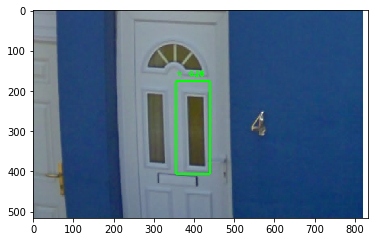

{'bbox': [[176, 356, 407, 439]], 'label': [1], 'score': [0.2541023790836334]} 

16.png (516, 833, 3)
1-boxes are detected.


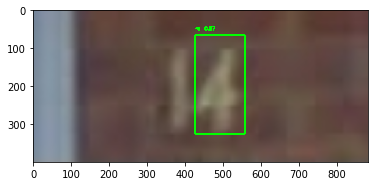

{'bbox': [[7, 46, 35, 60]], 'label': [4], 'score': [0.8657585978507996]} 

17.png (43, 95, 3)
2-boxes are detected.


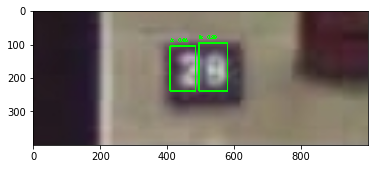

{'bbox': [[11, 43, 25, 51], [10, 52, 25, 61]], 'label': [3, 8], 'score': [0.8612750768661499, 0.2876303791999817]} 

18.png (42, 105, 3)
2-boxes are detected.


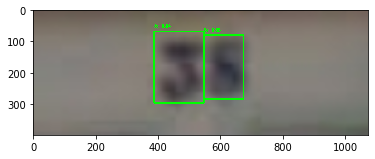

{'bbox': [[6, 34, 26, 48], [7, 48, 25, 59]], 'label': [3, 8], 'score': [0.8366042375564575, 0.850336492061615]} 

19.png (35, 94, 3)
0-boxes are detected.


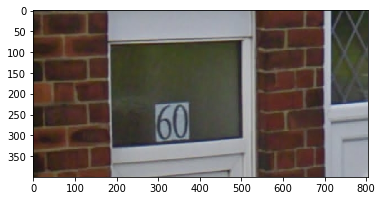

{'bbox': [], 'label': [], 'score': []} 

20.png (298, 600, 3)
2-boxes are detected.


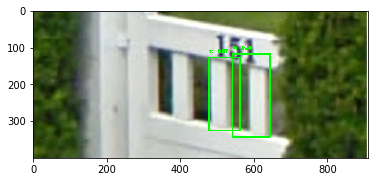

{'bbox': [[38, 141, 96, 166], [35, 160, 101, 190]], 'label': [1, 1], 'score': [0.5722677111625671, 0.36471936106681824]} 

21.png (118, 269, 3)
1-boxes are detected.


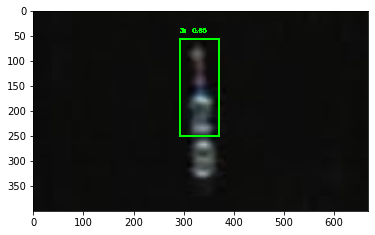

{'bbox': [[12, 61, 52, 77]], 'label': [3], 'score': [0.6468440294265747]} 

22.png (83, 139, 3)
2-boxes are detected.


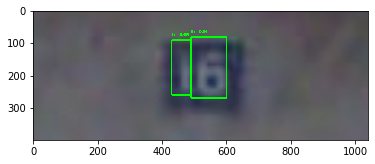

{'bbox': [[9, 43, 26, 49], [8, 49, 27, 60]], 'label': [1, 6], 'score': [0.6530380845069885, 0.5053378939628601]} 

23.png (40, 104, 3)
3-boxes are detected.


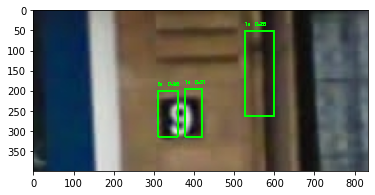

{'bbox': [[12, 124, 62, 141], [47, 73, 74, 85], [46, 89, 74, 99]], 'label': [1, 5, 1], 'score': [0.2608931362628937, 0.38145068287849426, 0.31121891736984253]} 

24.png (94, 196, 3)
3-boxes are detected.


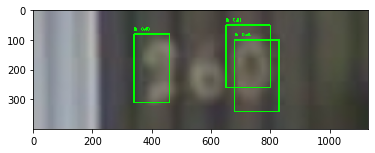

{'bbox': [[5, 65, 26, 80], [8, 34, 31, 46], [10, 68, 34, 83]], 'label': [6, 2, 9], 'score': [0.5074174404144287, 0.3996364176273346, 0.482189416885376]} 

25.png (40, 113, 3)
1-boxes are detected.


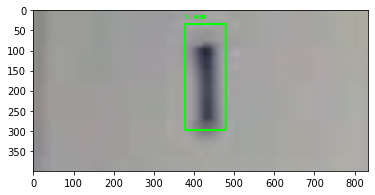

{'bbox': [[3, 33, 26, 42]], 'label': [1], 'score': [0.5879853367805481]} 

26.png (35, 73, 3)
0-boxes are detected.


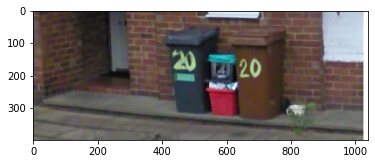

{'bbox': [], 'label': [], 'score': []} 

27.png (294, 764, 3)
1-boxes are detected.


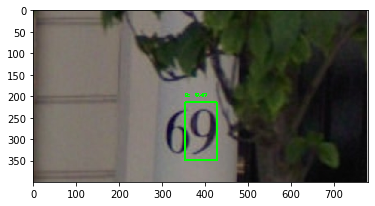

{'bbox': [[111, 183, 181, 222]], 'label': [9], 'score': [0.46820691227912903]} 

28.png (207, 404, 3)
1-boxes are detected.


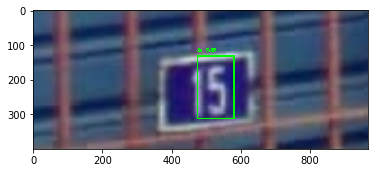

{'bbox': [[21, 76, 50, 93]], 'label': [5], 'score': [0.8468698263168335]} 

29.png (64, 155, 3)
1-boxes are detected.


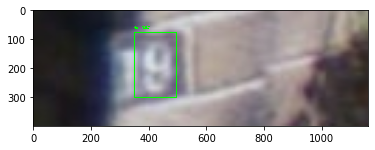

{'bbox': [[8, 36, 31, 51]], 'label': [9], 'score': [0.5673908591270447]} 

30.png (41, 119, 3)
2-boxes are detected.


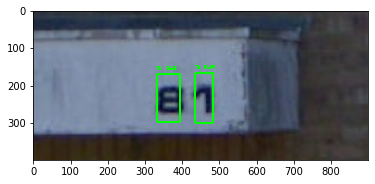

{'bbox': [[53, 104, 93, 123], [52, 136, 94, 151]], 'label': [5, 7], 'score': [0.3321404755115509, 0.3616010248661041]} 

31.png (125, 281, 3)
2-boxes are detected.


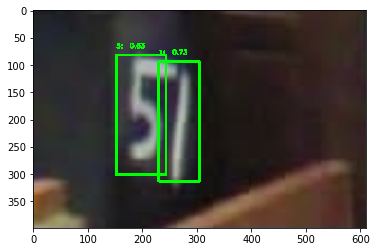

{'bbox': [[20, 37, 73, 59], [23, 56, 76, 74]], 'label': [5, 1], 'score': [0.6333020925521851, 0.7295835018157959]} 

32.png (97, 148, 3)
4-boxes are detected.


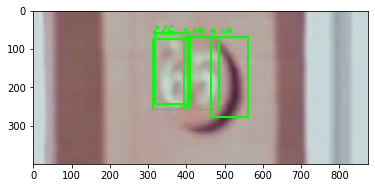

{'bbox': [[12, 63, 48, 81], [15, 62, 51, 80], [14, 78, 51, 96], [14, 92, 55, 111]], 'label': [5, 6, 5, 6], 'score': [0.707857608795166, 0.5999543070793152, 0.5974292159080505, 0.35352084040641785]} 

33.png (79, 173, 3)
2-boxes are detected.


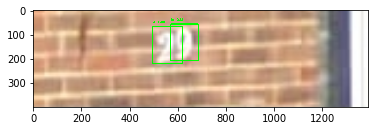

{'bbox': [[6, 60, 22, 72], [7, 52, 23, 65]], 'label': [9, 2], 'score': [0.5801423192024231, 0.6195191740989685]} 

34.png (42, 146, 3)
1-boxes are detected.


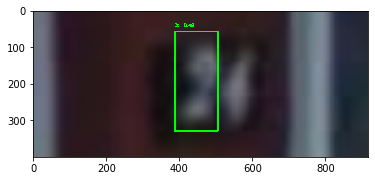

{'bbox': [[5, 33, 28, 43]], 'label': [3], 'score': [0.42001983523368835]} 

35.png (34, 78, 3)
2-boxes are detected.


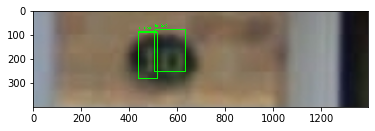

{'bbox': [[8, 52, 26, 65], [9, 45, 29, 53]], 'label': [6, 1], 'score': [0.4185887277126312, 0.28877878189086914]} 

36.png (41, 143, 3)
1-boxes are detected.


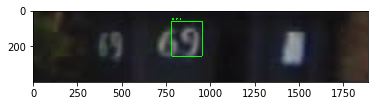

{'bbox': [[7, 92, 30, 112]], 'label': [9], 'score': [0.7611110210418701]} 

37.png (47, 222, 3)
1-boxes are detected.


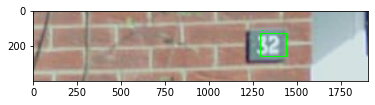

{'bbox': [[18, 178, 36, 198]], 'label': [2], 'score': [0.4187421202659607]} 

38.png (55, 262, 3)
1-boxes are detected.


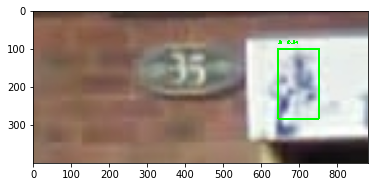

{'bbox': [[15, 95, 42, 111]], 'label': [3], 'score': [0.3428167700767517]} 

39.png (59, 130, 3)
1-boxes are detected.


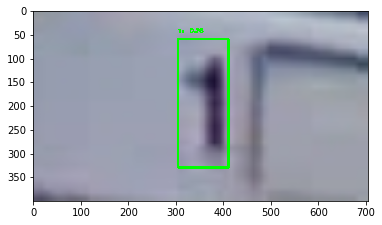

{'bbox': [[5, 26, 28, 35]], 'label': [1], 'score': [0.7772367596626282]} 

40.png (34, 60, 3)
2-boxes are detected.


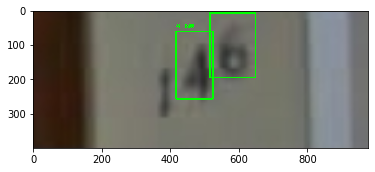

{'bbox': [[1, 58, 22, 73], [7, 47, 29, 59]], 'label': [6, 4], 'score': [0.7382028102874756, 0.8947368264198303]} 

41.png (45, 110, 3)
1-boxes are detected.


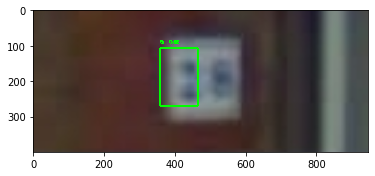

{'bbox': [[13, 44, 33, 57]], 'label': [5], 'score': [0.6234540939331055]} 

42.png (49, 116, 3)
1-boxes are detected.


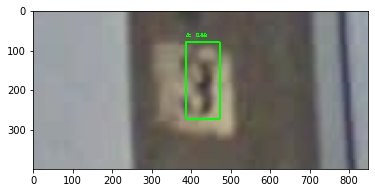

{'bbox': [[13, 64, 45, 78]], 'label': [3], 'score': [0.6901894807815552]} 

43.png (66, 140, 3)
1-boxes are detected.


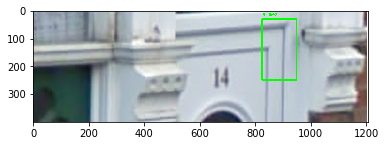

{'bbox': [[9, 237, 72, 273]], 'label': [7], 'score': [0.43009525537490845]} 

44.png (115, 347, 3)
5-boxes are detected.


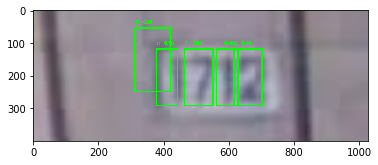

{'bbox': [[5, 29, 23, 39], [11, 35, 27, 41], [11, 43, 27, 51], [11, 52, 27, 58], [11, 57, 27, 65]], 'label': [7, 1, 7, 1, 2], 'score': [0.3912203311920166, 0.49503883719444275, 0.8317461609840393, 0.48861077427864075, 0.4377042353153229]} 

45.png (37, 95, 3)
2-boxes are detected.


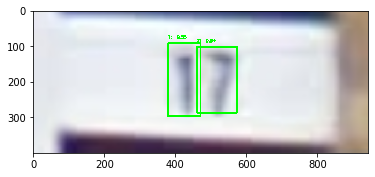

{'bbox': [[9, 37, 29, 46], [10, 45, 28, 56]], 'label': [1, 7], 'score': [0.554154098033905, 0.8438984155654907]} 

46.png (39, 92, 3)
1-boxes are detected.


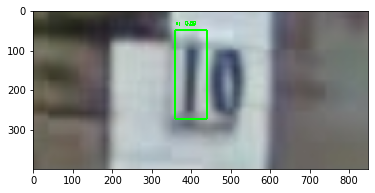

{'bbox': [[5, 37, 28, 45]], 'label': [1], 'score': [0.591566801071167]} 

47.png (41, 87, 3)
0-boxes are detected.


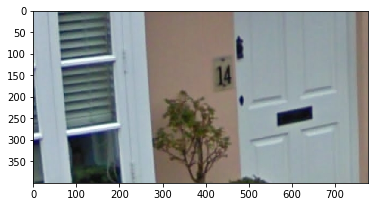

{'bbox': [], 'label': [], 'score': []} 

48.png (319, 621, 3)
2-boxes are detected.


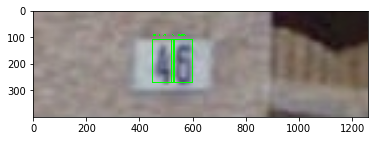

{'bbox': [[11, 45, 27, 53], [11, 52, 27, 60]], 'label': [4, 6], 'score': [0.7134610414505005, 0.8839119076728821]} 

49.png (40, 126, 3)
3-boxes are detected.


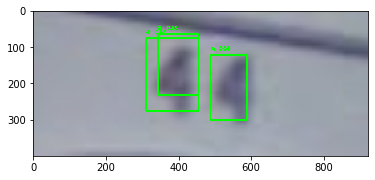

{'bbox': [[6, 31, 21, 41], [7, 28, 25, 41], [11, 44, 27, 53]], 'label': [3, 4, 4], 'score': [0.6288130283355713, 0.6320903301239014, 0.3557087182998657]} 

50.png (36, 83, 3)
2-boxes are detected.


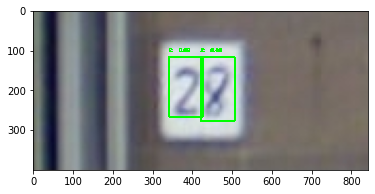

{'bbox': [[22, 64, 50, 80], [22, 79, 52, 95]], 'label': [2, 2], 'score': [0.8915315866470337, 0.6027958989143372]} 

51.png (75, 158, 3)
3-boxes are detected.


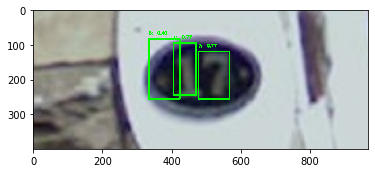

{'bbox': [[14, 56, 43, 71], [16, 68, 41, 79], [20, 80, 43, 95]], 'label': [6, 1, 7], 'score': [0.4030073285102844, 0.768884003162384, 0.7720907330513]} 

52.png (67, 162, 3)
1-boxes are detected.


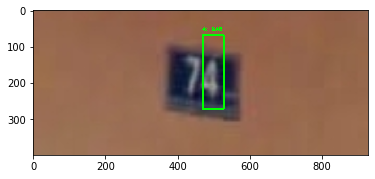

{'bbox': [[12, 81, 47, 91]], 'label': [4], 'score': [0.4561888873577118]} 

53.png (69, 160, 3)
1-boxes are detected.


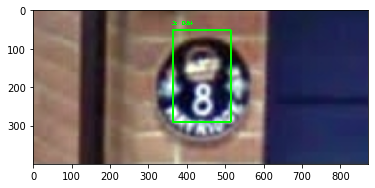

{'bbox': [[10, 70, 56, 99]], 'label': [3], 'score': [0.8439394235610962]} 

54.png (77, 168, 3)
2-boxes are detected.


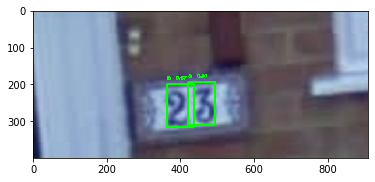

{'bbox': [[38, 69, 60, 83], [37, 80, 59, 94]], 'label': [2, 3], 'score': [0.6712507009506226, 0.5103870630264282]} 

55.png (76, 173, 3)
2-boxes are detected.


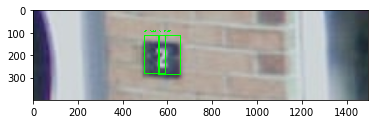

{'bbox': [[15, 67, 38, 80], [15, 76, 39, 89]], 'label': [3, 3], 'score': [0.4263891875743866, 0.3242340385913849]} 

56.png (54, 202, 3)
2-boxes are detected.


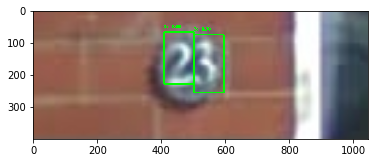

{'bbox': [[8, 48, 27, 59], [9, 59, 30, 70]], 'label': [2, 3], 'score': [0.5838688611984253, 0.6998361349105835]} 

57.png (47, 123, 3)
4-boxes are detected.


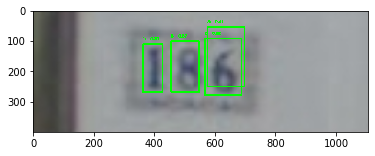

{'bbox': [[6, 62, 27, 75], [12, 39, 29, 46], [11, 49, 29, 59], [10, 61, 30, 74]], 'label': [5, 1, 8, 6], 'score': [0.41395989060401917, 0.7029160261154175, 0.8668765425682068, 0.8210047483444214]} 

58.png (43, 119, 3)
3-boxes are detected.


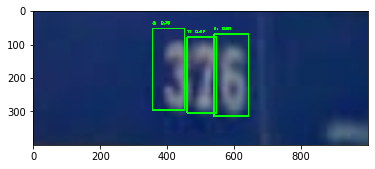

{'bbox': [[6, 41, 34, 52], [9, 53, 35, 63], [8, 62, 36, 74]], 'label': [3, 7, 6], 'score': [0.7860314249992371, 0.6704190373420715, 0.9078542590141296]} 

59.png (46, 115, 3)
1-boxes are detected.


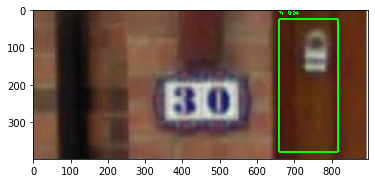

{'bbox': [[6, 160, 92, 198]], 'label': [7], 'score': [0.3392782211303711]} 

60.png (97, 218, 3)
1-boxes are detected.


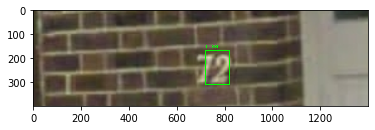

{'bbox': [[32, 137, 59, 156]], 'label': [2], 'score': [0.6812534928321838]} 

61.png (76, 266, 3)
2-boxes are detected.


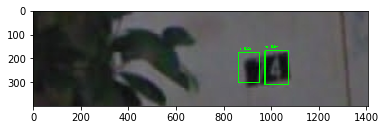

{'bbox': [[38, 183, 64, 202], [36, 207, 66, 228]], 'label': [1, 4], 'score': [0.31806597113609314, 0.8393225073814392]} 

62.png (85, 299, 3)
3-boxes are detected.


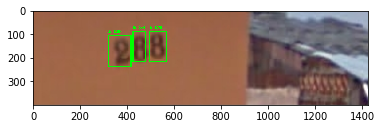

{'bbox': [[21, 102, 52, 115], [21, 119, 52, 136], [25, 77, 57, 100]], 'label': [8, 8, 2], 'score': [0.4856722354888916, 0.788187563419342, 0.7998700737953186]} 

63.png (96, 342, 3)
3-boxes are detected.


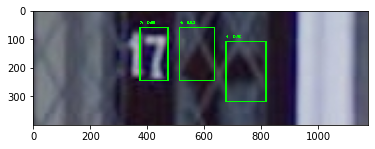

{'bbox': [[7, 46, 30, 58], [7, 63, 30, 78], [13, 83, 39, 100]], 'label': [7, 4, 4], 'score': [0.8813257217407227, 0.6261573433876038, 0.4034511148929596]} 

64.png (49, 144, 3)
2-boxes are detected.


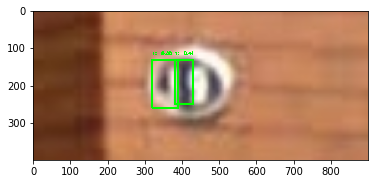

{'bbox': [[13, 32, 26, 39], [13, 38, 25, 43]], 'label': [1, 1], 'score': [0.3788662552833557, 0.41109082102775574]} 

65.png (40, 90, 3)
2-boxes are detected.


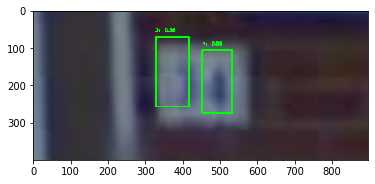

{'bbox': [[8, 37, 29, 47], [12, 51, 31, 60]], 'label': [3, 4], 'score': [0.383315771818161, 0.5640224814414978]} 

66.png (45, 101, 3)
1-boxes are detected.


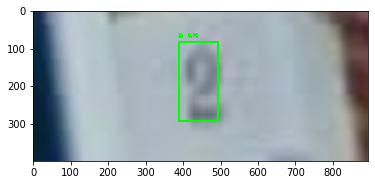

{'bbox': [[7, 33, 25, 42]], 'label': [2], 'score': [0.6999083161354065]} 

67.png (34, 76, 3)
2-boxes are detected.


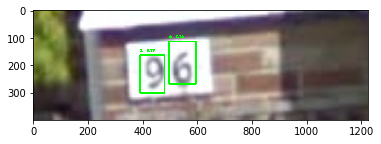

{'bbox': [[14, 61, 33, 73], [20, 48, 37, 59]], 'label': [6, 9], 'score': [0.7244436740875244, 0.7907339334487915]} 

68.png (49, 150, 3)
0-boxes are detected.


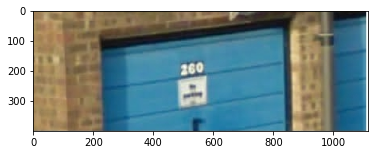

{'bbox': [], 'label': [], 'score': []} 

69.png (151, 421, 3)
1-boxes are detected.


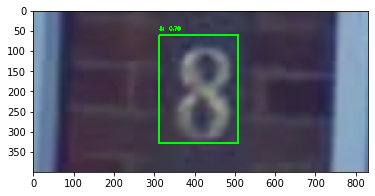

{'bbox': [[8, 40, 42, 65]], 'label': [8], 'score': [0.7854376435279846]} 

70.png (51, 106, 3)
1-boxes are detected.


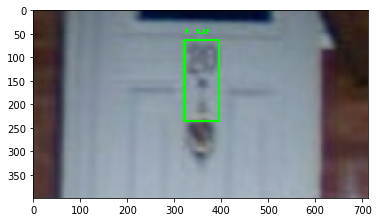

{'bbox': [[14, 71, 52, 87]], 'label': [7], 'score': [0.36780521273612976]} 

71.png (88, 157, 3)
1-boxes are detected.


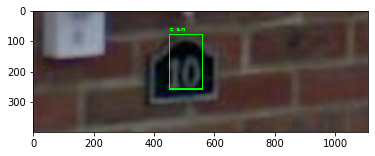

{'bbox': [[12, 70, 40, 87]], 'label': [6], 'score': [0.308639794588089]} 

72.png (62, 172, 3)
1-boxes are detected.


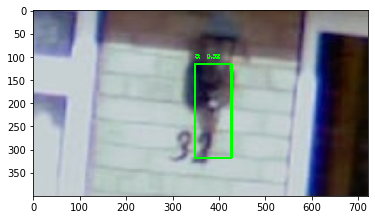

{'bbox': [[30, 90, 82, 110]], 'label': [3], 'score': [0.3201085329055786]} 

73.png (103, 186, 3)
1-boxes are detected.


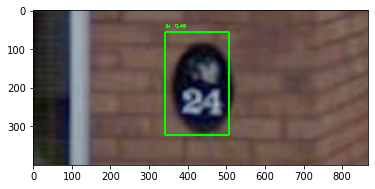

{'bbox': [[12, 71, 67, 105]], 'label': [6], 'score': [0.48851826786994934]} 

74.png (83, 180, 3)
3-boxes are detected.


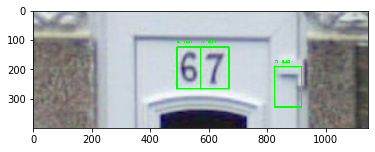

{'bbox': [[29, 117, 63, 136], [29, 136, 63, 159], [45, 196, 78, 218]], 'label': [6, 7, 7], 'score': [0.7126264572143555, 0.7522563934326172, 0.3043874204158783]} 

75.png (95, 272, 3)
2-boxes are detected.


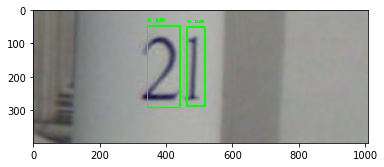

{'bbox': [[12, 87, 74, 112], [13, 117, 73, 131]], 'label': [2, 1], 'score': [0.8002476692199707, 0.6933132410049438]} 

76.png (101, 255, 3)
0-boxes are detected.


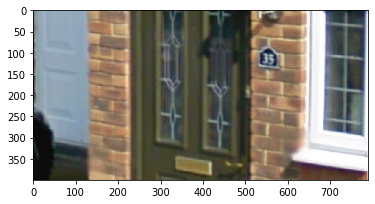

{'bbox': [], 'label': [], 'score': []} 

77.png (258, 510, 3)
0-boxes are detected.


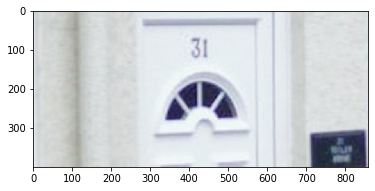

{'bbox': [], 'label': [], 'score': []} 

78.png (137, 294, 3)
1-boxes are detected.


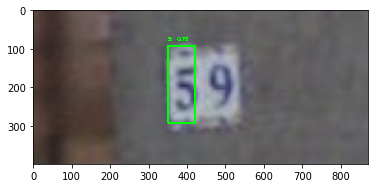

{'bbox': [[13, 49, 41, 59]], 'label': [5], 'score': [0.7328777313232422]} 

79.png (56, 122, 3)
1-boxes are detected.


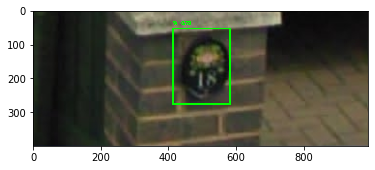

{'bbox': [[19, 145, 97, 204]], 'label': [9], 'score': [0.7309100031852722]} 

80.png (140, 347, 3)
1-boxes are detected.


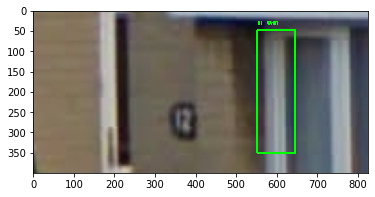

{'bbox': [[11, 126, 80, 147]], 'label': [1], 'score': [0.612443745136261]} 

81.png (91, 188, 3)
1-boxes are detected.


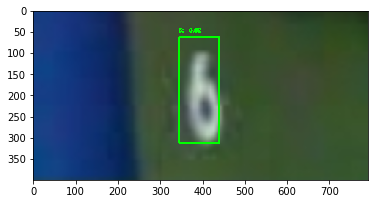

{'bbox': [[8, 43, 39, 55]], 'label': [6], 'score': [0.8197723031044006]} 

82.png (50, 99, 3)
4-boxes are detected.


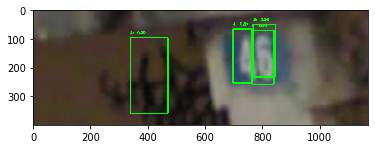

{'bbox': [[10, 152, 46, 167], [13, 138, 50, 151], [14, 151, 51, 166], [19, 67, 71, 93]], 'label': [5, 4, 6, 4], 'score': [0.36013224720954895, 0.5052605867385864, 0.7269319891929626, 0.3047572672367096]} 

83.png (79, 231, 3)
2-boxes are detected.


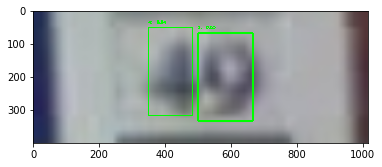

{'bbox': [[3, 21, 19, 29], [4, 30, 20, 40]], 'label': [4, 9], 'score': [0.8357185125350952, 0.5480163097381592]} 

84.png (24, 61, 3)
2-boxes are detected.


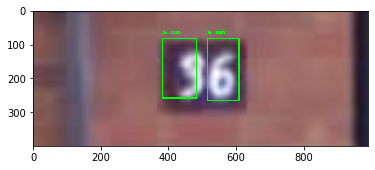

{'bbox': [[10, 46, 31, 58], [10, 62, 32, 73]], 'label': [3, 6], 'score': [0.6339303851127625, 0.8088154196739197]} 

85.png (48, 119, 3)
1-boxes are detected.


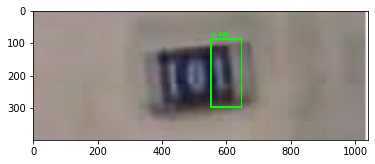

{'bbox': [[12, 76, 41, 89]], 'label': [4], 'score': [0.37652140855789185]} 

86.png (55, 143, 3)
0-boxes are detected.


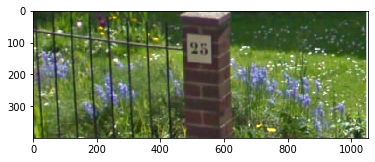

{'bbox': [], 'label': [], 'score': []} 

87.png (248, 653, 3)
1-boxes are detected.


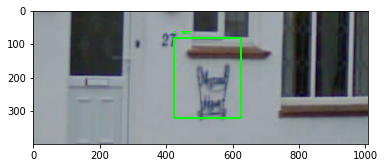

{'bbox': [[35, 181, 138, 268]], 'label': [7], 'score': [0.26754215359687805]} 

88.png (171, 431, 3)
3-boxes are detected.


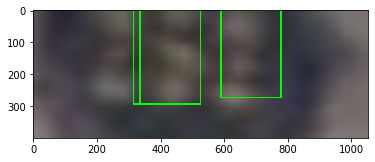

{'bbox': [[0, 15, 14, 25], [0, 28, 13, 37], [0, 16, 14, 25]], 'label': [5, 3, 2], 'score': [0.5482826232910156, 0.6016599535942078, 0.4536699950695038]} 

89.png (19, 50, 3)
1-boxes are detected.


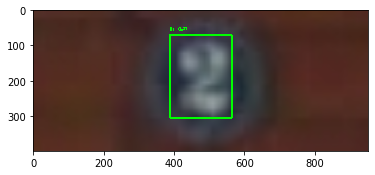

{'bbox': [[6, 33, 26, 48]], 'label': [2], 'score': [0.709605872631073]} 

90.png (34, 81, 3)
1-boxes are detected.


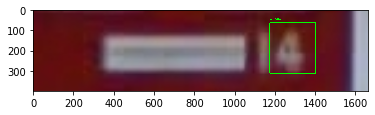

{'bbox': [[5, 94, 25, 112]], 'label': [4], 'score': [0.6375798583030701]} 

91.png (32, 133, 3)
2-boxes are detected.


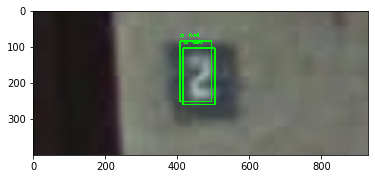

{'bbox': [[10, 47, 29, 57], [12, 48, 30, 58]], 'label': [3, 2], 'score': [0.46335023641586304, 0.552865207195282]} 

92.png (46, 107, 3)
1-boxes are detected.


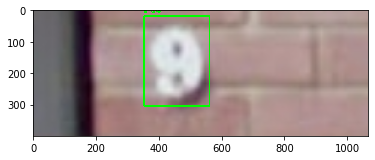

{'bbox': [[2, 37, 32, 59]], 'label': [9], 'score': [0.47575777769088745]} 

93.png (42, 112, 3)
2-boxes are detected.


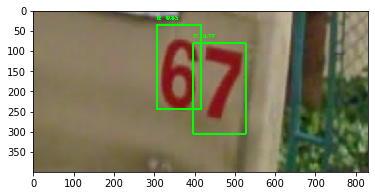

{'bbox': [[15, 127, 102, 173], [34, 165, 127, 219]], 'label': [6, 7], 'score': [0.8333913683891296, 0.7699517011642456]} 

94.png (166, 345, 3)
0-boxes are detected.


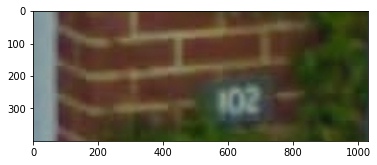

{'bbox': [], 'label': [], 'score': []} 

95.png (76, 196, 3)
1-boxes are detected.


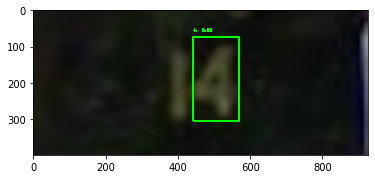

{'bbox': [[7, 42, 29, 54]], 'label': [4], 'score': [0.6491591334342957]} 

96.png (38, 88, 3)
2-boxes are detected.


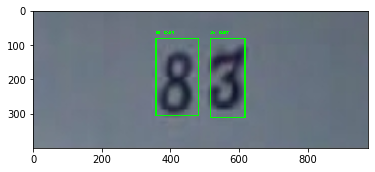

{'bbox': [[14, 61, 52, 82], [14, 88, 53, 105]], 'label': [8, 3], 'score': [0.839363694190979, 0.8745934367179871]} 

97.png (68, 166, 3)
4-boxes are detected.


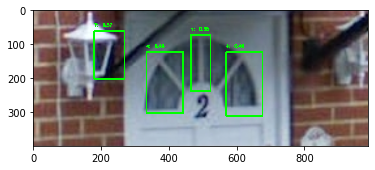

{'bbox': [[16, 47, 53, 70], [19, 121, 62, 136], [32, 87, 79, 115], [32, 148, 81, 176]], 'label': [7, 1, 4, 4], 'score': [0.5719897747039795, 0.3835824728012085, 0.48280221223831177, 0.4774470329284668]} 

98.png (104, 257, 3)
1-boxes are detected.


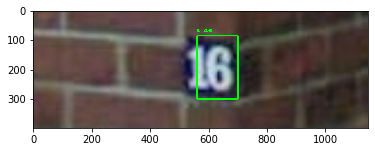

{'bbox': [[11, 73, 39, 91]], 'label': [8], 'score': [0.47700002789497375]} 

99.png (52, 149, 3)
1-boxes are detected.


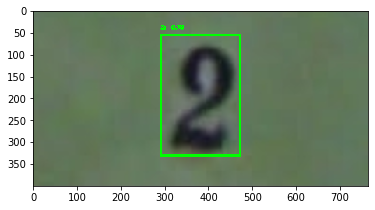

{'bbox': [[13, 67, 76, 109]], 'label': [2], 'score': [0.7912119626998901]} 



In [13]:
THRESHOLD = 0.25
result_list = []

def bbox_format(boxes):
    '''
        bbox = [[y1, x1, y2, x2], [y1, x1, y2, x2], ...]
    '''
    boxes[:, [0,1]] = boxes[:, [1,0]]
    boxes[:, [2,3]] = boxes[:, [3,2]]
    return boxes

for i in range(1, 100): # total 13069
    # read image
    print(f"{i}.png", img.shape)
    img_file = os.path.join(DEFAULT_IMAGE_FOLDER, f"{i}.png")
    img = cv2.imread(img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # three size of images
    crop_imgs = []
    crop_imgs.append(img)
#     crop_imgs.append(sharpen_img(img))
    crop_imgs.append(img[:, int(img.shape[1]*0.2):int(img.shape[1]*0.8), :])
    crop_imgs.append(img[int(img.shape[0]*0.15):int(img.shape[0]*0.85), int(img.shape[1]*0.2):int(img.shape[1]*0.8), :])
#     crop_imgs.append(sharpen_img(img[int(img.shape[0]*0.15):int(img.shape[0]*0.85), int(img.shape[1]*0.2):int(img.shape[1]*0.8), :]))
#     crop_imgs.append(img[int(img.shape[0]*0.25):int(img.shape[0]*0.75), int(img.shape[1]*0.3):int(img.shape[1]*0.7), :])
    
    # choose best cropping
    best_boxes, best_probs = [], []
    best_avg_confidence = -999
    best_crop_img = img
    best_crop_img_idx = 0
    
    for crop_img in crop_imgs:
        boxes, probs = yolo_detector.predict(crop_img, THRESHOLD)
        if len(boxes) > 0:
            avg_confidence = np.amax(np.array(probs), axis=1).mean()
            if avg_confidence > best_avg_confidence:
                best_avg_confidence = avg_confidence
                best_boxes = boxes
                best_probs = probs
                best_crop_img = crop_img
    # print(best_boxes, best_probs)

    # match boxes coordinate to original image
    if crop_imgs.index(best_crop_img) == 0:
        pass
    elif crop_imgs.index(best_crop_img) == 1:
        best_boxes[:,0] = best_boxes[:,0] + int(img.shape[1]*0.2)
        best_boxes[:,2] = best_boxes[:,2] + int(img.shape[1]*0.2)
    elif crop_imgs.index(best_crop_img) == 2:
        best_boxes[:,0] = best_boxes[:,0] + int(img.shape[1]*0.2)
        best_boxes[:,1] = best_boxes[:,1] + int(img.shape[0]*0.15)
        best_boxes[:,2] = best_boxes[:,2] + int(img.shape[1]*0.2)
        best_boxes[:,3] = best_boxes[:,3] + int(img.shape[0]*0.15)
    
    # detection result
    image = draw_scaled_boxes(img, best_boxes, best_probs, ["10", "1", "2", "3", "4", "5", "6", "7", "8", "9"])
    print("{}-boxes are detected.".format(len(best_boxes)))
    plt.imshow(image)
    plt.show()
    
    # append to result list
    result_dict = {"bbox":[], "label":[], "score":[]}
    try:
        result_dict["bbox"] = bbox_format(best_boxes).tolist()
        result_dict["label"] = np.argmax(np.array(best_probs), axis=1).tolist()
        result_dict["score"] = np.amax(np.array(best_probs), axis=1).tolist()
        result_list.append(result_dict)
    except:
        pass
    print(result_dict, '\n')
    
# print(result_list)


In [9]:
# result to file

import json
result_json = json.dumps(result_list)
with open('0856125.json', 'w') as f:
    json.dump(result_list, f)